In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from prophet import Prophet
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler

import warnings
warnings.filterwarnings("ignore")

In [2]:
df = pd.read_csv('PH2025-1_Act2025-05-29.csv', sep=";", encoding='utf-16-le', engine='python')
df.head()

,Fila,NombreCentral,Chimenea,UGE,Periodo,Fecha Carga,FECHA,CONCENTRACION_NOX_PPM,CONCENTRACION_NOX_MG_NM3,CONCENTRACION_SO2_PPM,...,TIPO_DATO_NOX,TIPO_DATO_O2,TIPO_DATO_FLUJO,CONSUMO_COMBUSTIBLE,FLUJO_GASES_SALIDA_BASE_HUMEDA_M3_H,FLUJO_GASES_SALIDA_BASE_SECA_M3_H,TIPO_DATO_CO2,TIPO_DATO_TEMPERATURA,TIPO_DATO_PRESION,TIPO_DATO_HUMEDAD
0,68065,ANDINA,CTA,CTA,2025/1,2025-04-30,2025-01-01 00:00:00,"0,28999999165535","279,299987792969",0,...,DM,DM,DM,0,"6868,68017578125","6271,10986328125",DM,DM,DM,DM
1,68066,ANDINA,CTA,CTA,2025/1,2025-04-30,2025-01-01 01:00:00,"0,370000004768372","366,350006103516",0,...,DM,DM,DM,0,"7593,64013671875",6933,DM,DM,DM,DM
2,68067,ANDINA,CTA,CTA,2025/1,2025-04-30,2025-01-01 02:00:00,"0,159999996423721","162,160003662109",0,...,DM,DM,DM,0,"7350,64013671875","6711,14013671875",DM,DM,DM,DM
3,68068,ANDINA,CTA,CTA,2025/1,2025-04-30,2025-01-01 03:00:00,"0,0199999995529652","21,2600002288818",0,...,DM,DM,DM,0,"6853,10009765625","6256,8798828125",DM,DM,DM,DM
4,68069,ANDINA,CTA,CTA,2025/1,2025-04-30,2025-01-01 04:00:00,"0,00999999977648258","10,5100002288818",0,...,DM,DM,DM,0,"6776,330078125","6186,7900390625",DM,DM,DM,DM


In [3]:
df.dtypes

Fila                                    int64
NombreCentral                          object
Chimenea                               object
UGE                                    object
Periodo                                object
Fecha Carga                            object
FECHA                                  object
CONCENTRACION_NOX_PPM                  object
CONCENTRACION_NOX_MG_NM3               object
CONCENTRACION_SO2_PPM                  object
CONCENTRACION_SO2_MG_NM3               object
CONCENTRACION_MP_MG_M3                 object
CONCENTRACION_MP_MG_NM3                object
OXIGENO_PORCENTAJE_BASE_SECA           object
HUMEDAD_PORCENTAJE                     object
CONCENTRACION_PORCENTAJE_CO2           object
TEMPERATURA_GASES_SALIDA_C             object
PRESION_GASES_SALIDA_ATM               object
FLUJO_GASES_SALIDA_NM3_H               object
TEMPERATURA_COMBUSTION_MINIMA_C        object
TEMPERATURA_COMBUSTION_MAXIMA_C        object
POTENCIA_BRUTA_MWH                

In [4]:
df.columns

Index(['Fila', 'NombreCentral', 'Chimenea', 'UGE', 'Periodo', 'Fecha Carga',
       'FECHA', 'CONCENTRACION_NOX_PPM', 'CONCENTRACION_NOX_MG_NM3',
       'CONCENTRACION_SO2_PPM', 'CONCENTRACION_SO2_MG_NM3',
       'CONCENTRACION_MP_MG_M3', 'CONCENTRACION_MP_MG_NM3',
       'OXIGENO_PORCENTAJE_BASE_SECA', 'HUMEDAD_PORCENTAJE',
       'CONCENTRACION_PORCENTAJE_CO2', 'TEMPERATURA_GASES_SALIDA_C',
       'PRESION_GASES_SALIDA_ATM', 'FLUJO_GASES_SALIDA_NM3_H',
       'TEMPERATURA_COMBUSTION_MINIMA_C', 'TEMPERATURA_COMBUSTION_MAXIMA_C',
       'POTENCIA_BRUTA_MWH', 'CONCENTRACION_CO2_TON_MWH',
       'CONCENTRACION_NOX_MG_MWH', 'CONCENTRACION_SO2_MG_MWH',
       'CONCENTRACION_MP_MG_MWH', 'TIPO_DE_FUENTE_EMISORA', 'TIPO_COMBUSTIBLE',
       'COMBUSTIBLE', 'ESTADO_UGE', 'TIPO_DATO_MP', 'TIPO_DATO_SO2',
       'TIPO_DATO_NOX', 'TIPO_DATO_O2', 'TIPO_DATO_FLUJO',
       'CONSUMO_COMBUSTIBLE', 'FLUJO_GASES_SALIDA_BASE_HUMEDA_M3_H',
       'FLUJO_GASES_SALIDA_BASE_SECA_M3_H', 'TIPO_DATO_CO2',
     

In [5]:
columnas_a_convertir = [
    'CONCENTRACION_NOX_PPM', 'CONCENTRACION_NOX_MG_NM3',
    'CONCENTRACION_SO2_PPM', 'CONCENTRACION_SO2_MG_NM3',
    'CONCENTRACION_MP_MG_M3', 'CONCENTRACION_MP_MG_NM3',
    'OXIGENO_PORCENTAJE_BASE_SECA', 'HUMEDAD_PORCENTAJE',
    'CONCENTRACION_PORCENTAJE_CO2', 'TEMPERATURA_GASES_SALIDA_C',
    'PRESION_GASES_SALIDA_ATM', 'FLUJO_GASES_SALIDA_NM3_H',
    'TEMPERATURA_COMBUSTION_MINIMA_C', 'TEMPERATURA_COMBUSTION_MAXIMA_C',
    'POTENCIA_BRUTA_MWH', 'CONCENTRACION_CO2_TON_MWH',
    'CONCENTRACION_NOX_MG_MWH','FLUJO_GASES_SALIDA_BASE_HUMEDA_M3_H',
       'FLUJO_GASES_SALIDA_BASE_SECA_M3_H'
]

for col in columnas_a_convertir:
    df[col] = pd.to_numeric(df[col], errors='coerce')


In [6]:
df.dtypes


Fila                                     int64
NombreCentral                           object
Chimenea                                object
UGE                                     object
Periodo                                 object
Fecha Carga                             object
FECHA                                   object
CONCENTRACION_NOX_PPM                  float64
CONCENTRACION_NOX_MG_NM3               float64
CONCENTRACION_SO2_PPM                  float64
CONCENTRACION_SO2_MG_NM3               float64
CONCENTRACION_MP_MG_M3                 float64
CONCENTRACION_MP_MG_NM3                float64
OXIGENO_PORCENTAJE_BASE_SECA           float64
HUMEDAD_PORCENTAJE                     float64
CONCENTRACION_PORCENTAJE_CO2           float64
TEMPERATURA_GASES_SALIDA_C             float64
PRESION_GASES_SALIDA_ATM               float64
FLUJO_GASES_SALIDA_NM3_H               float64
TEMPERATURA_COMBUSTION_MINIMA_C        float64
TEMPERATURA_COMBUSTION_MAXIMA_C        float64
POTENCIA_BRUT

In [7]:
# Asegúrate de que los nombres de las columnas coincidan exactamente
df['Fecha Carga'] = pd.to_datetime(df['Fecha Carga'], errors='coerce')
df['FECHA'] = pd.to_datetime(df['FECHA'], errors='coerce')


In [8]:
print(df[['Fecha Carga', 'FECHA']].dtypes)
print(df[['Fecha Carga', 'FECHA']].isna().sum())


Fecha Carga    datetime64[ns]
FECHA          datetime64[ns]
dtype: object
Fecha Carga    0
FECHA          0
dtype: int64


In [9]:
df.describe()

,Fila,Fecha Carga,FECHA,CONCENTRACION_NOX_PPM,CONCENTRACION_NOX_MG_NM3,CONCENTRACION_SO2_PPM,CONCENTRACION_SO2_MG_NM3,CONCENTRACION_MP_MG_M3,CONCENTRACION_MP_MG_NM3,OXIGENO_PORCENTAJE_BASE_SECA,...,TEMPERATURA_GASES_SALIDA_C,PRESION_GASES_SALIDA_ATM,FLUJO_GASES_SALIDA_NM3_H,TEMPERATURA_COMBUSTION_MINIMA_C,TEMPERATURA_COMBUSTION_MAXIMA_C,POTENCIA_BRUTA_MWH,CONCENTRACION_CO2_TON_MWH,CONCENTRACION_NOX_MG_MWH,FLUJO_GASES_SALIDA_BASE_HUMEDA_M3_H,FLUJO_GASES_SALIDA_BASE_SECA_M3_H
count,2.224800e+05,222480,222480,109920.000000,111422.000000,130130.000000,127976.000000,117783.000000,115811.000000,61873.000000,...,94923.000000,118895.000000,1.176430e+05,126443.000000,126197.000000,136991.000000,1.333630e+05,1.387130e+05,1.203690e+05,1.190420e+05
mean,4.819574e+06,2025-04-29 04:53:35.533980416,2025-02-14 23:30:00.000000256,0.073817,0.417503,0.046292,1.280420,0.002955,2.115783,0.054773,...,2.240153,0.305379,5.464931e+04,106.822679,125.972432,6.313429,8.827666e+00,9.141289e+06,1.177617e+05,1.042958e+05
min,6.806500e+04,2025-04-24 00:00:00,2025-01-01 00:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.270605e+06,2025-04-29 00:00:00,2025-01-23 11:45:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,4.897800e+06,2025-04-30 00:00:00,2025-02-14 23:30:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
75%,7.190718e+06,2025-04-30 00:00:00,2025-03-09 11:15:00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,1.000000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
max,9.594384e+06,2025-04-30 00:00:00,2025-03-31 23:00:00,300.000000,10838.000000,280.000000,27966.000000,40.000000,78938.000000,21.000000,...,650.000000,1.000000,2.890860e+06,1335.000000,1451.000000,500.000000,1.177245e+06,9.768714e+11,7.711544e+06,7.081754e+06
std,2.765466e+06,NaN,NaN,3.200322,39.509697,2.861015,162.369816,0.216584,277.680707,0.880677,...,15.769995,0.460570,2.770194e+05,274.379790,326.151817,39.827481,3.223660e+03,2.627945e+09,5.345939e+05,4.826670e+05


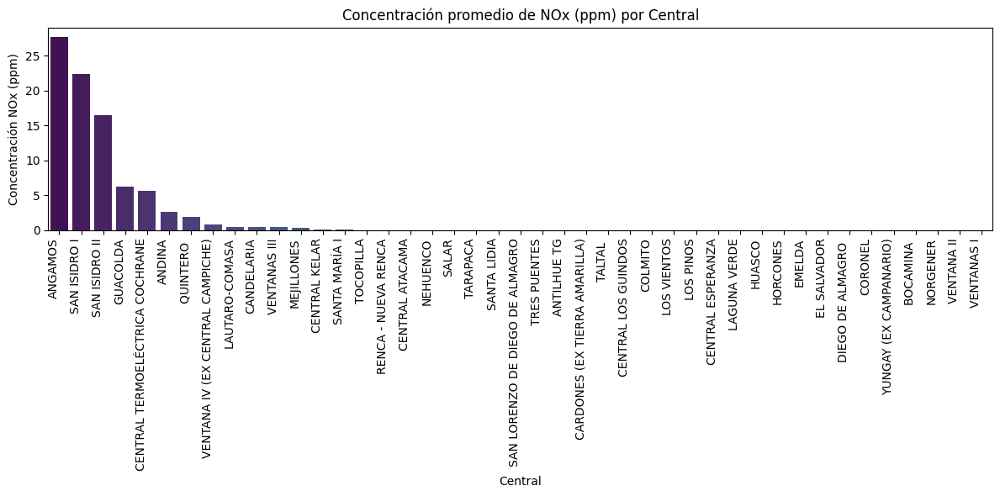

In [10]:
# Agrupar por 'NombreCentral' y calcular el promedio de 'CONCENTRACION_NOX_PPM'
df_grouped = df.groupby('NombreCentral')['CONCENTRACION_NOX_PPM'].mean().reset_index()

# Ordenar si se desea (opcional)
df_grouped = df_grouped.sort_values(by='CONCENTRACION_NOX_PPM', ascending=False)

# Gráfico de barras
plt.figure(figsize=(12, 6))
sns.barplot(data=df_grouped, x='NombreCentral', y='CONCENTRACION_NOX_PPM', palette='viridis')

# Estética del gráfico
plt.xticks(rotation=90, ha='right')
plt.title('Concentración promedio de NOx (ppm) por Central')
plt.xlabel('Central')
plt.ylabel('Concentración NOx (ppm)')
plt.tight_layout()

# Mostrar gráfico
plt.show()


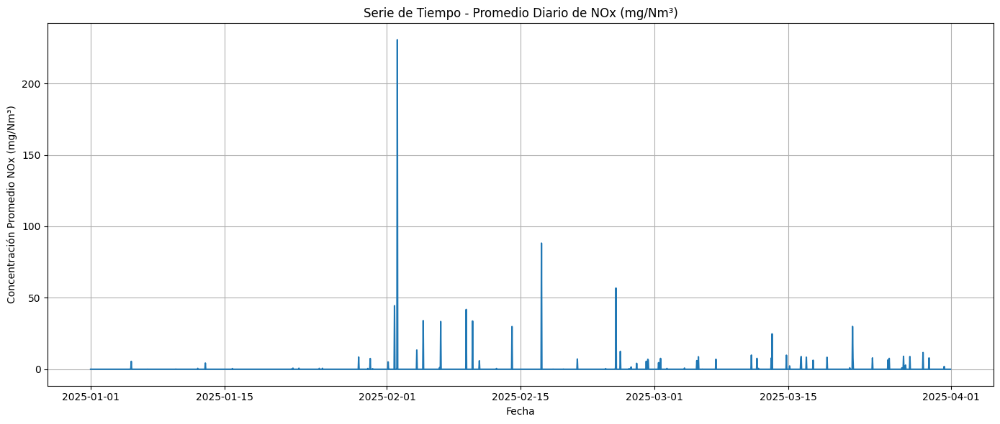

In [11]:
# Agrupar por fecha y calcular el promedio
df_diario = df.groupby('FECHA')['CONCENTRACION_NOX_MG_NM3'].mean().reset_index()

# Graficar
plt.figure(figsize=(14, 6))
sns.lineplot(data=df_diario, x='FECHA', y='CONCENTRACION_NOX_MG_NM3')
plt.title("Serie de Tiempo - Promedio Diario de NOx (mg/Nm³)")
plt.xlabel("Fecha")
plt.ylabel("Concentración Promedio NOx (mg/Nm³)")
plt.grid(True)
plt.tight_layout()
plt.show()


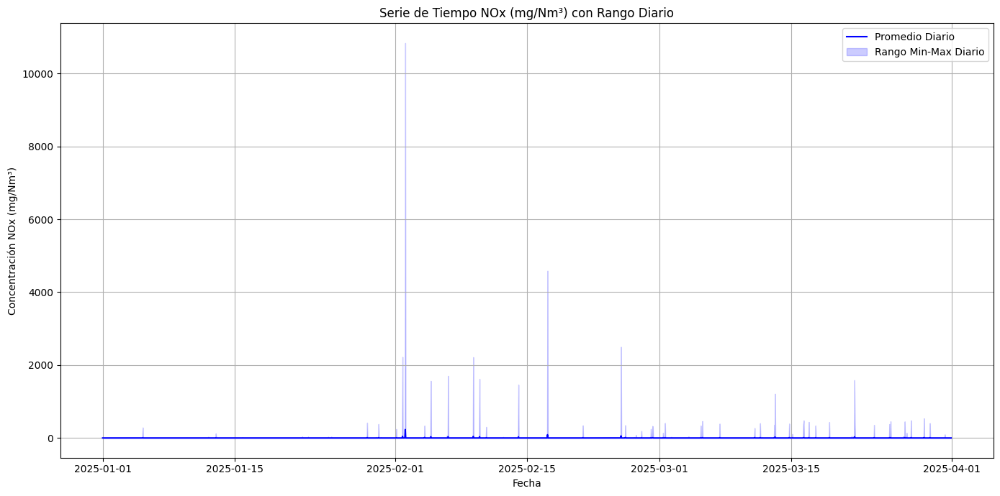

In [12]:


# Agrupar por fecha: promedio, mínimo y máximo de NOx
df_stats = df.groupby('FECHA')['CONCENTRACION_NOX_MG_NM3'].agg(['mean', 'min', 'max']).reset_index()

plt.figure(figsize=(14, 7))

# Línea promedio
sns.lineplot(data=df_stats, x='FECHA', y='mean', label='Promedio Diario', color='blue')

# Área sombreada entre mínimo y máximo
plt.fill_between(df_stats['FECHA'], df_stats['min'], df_stats['max'], color='blue', alpha=0.2, label='Rango Min-Max Diario')

plt.title('Serie de Tiempo NOx (mg/Nm³) con Rango Diario')
plt.xlabel('Fecha')
plt.ylabel('Concentración NOx (mg/Nm³)')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


# **Predicciones con prophet hasta enero de 2026**

In [13]:


# Prepara datos agrupando por fecha y sacando promedio (por ejemplo)
df_ts = df.groupby('FECHA')['CONCENTRACION_NOX_MG_NM3'].mean().reset_index()

# Renombrar columnas para Prophet
df_ts = df_ts.rename(columns={'FECHA': 'ds', 'CONCENTRACION_NOX_MG_NM3': 'y'})

# Asegurar que ds es datetime
df_ts['ds'] = pd.to_datetime(df_ts['ds'])


In [14]:
model = Prophet()
model.fit(df_ts)


12:43:49 - cmdstanpy - INFO - Chain [1] start processing
12:43:50 - cmdstanpy - INFO - Chain [1] done processing


In [15]:
# Crear un DataFrame con fechas futuras diarias hasta 31 de enero 2026
future = model.make_future_dataframe(periods= (pd.Timestamp('2026-01-31') - df_ts['ds'].max()).days)

# Verifica rango
print(f"Fecha última en datos: {df_ts['ds'].max()}")
print(f"Fecha final futura: {future['ds'].max()}")


Fecha última en datos: 2025-03-31 23:00:00
Fecha final futura: 2026-01-30 23:00:00


In [16]:
forecast = model.predict(future)


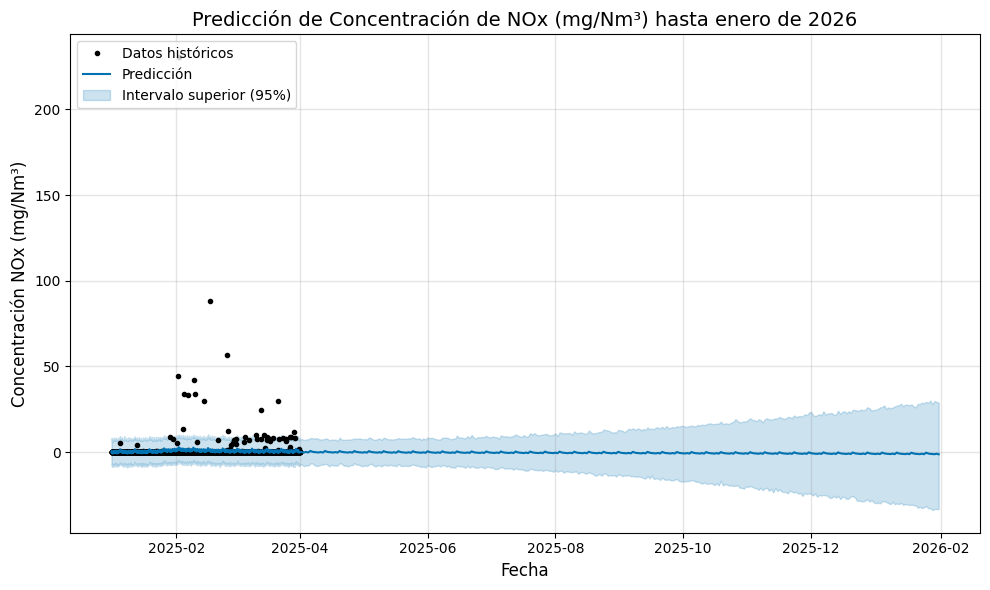

In [17]:
# Crear el gráfico base
fig = model.plot(forecast)

# Agregar título y etiquetas personalizadas
plt.title('Predicción de Concentración de NOx (mg/Nm³) hasta enero de 2026', fontsize=14)
plt.xlabel('Fecha', fontsize=12)
plt.ylabel('Concentración NOx (mg/Nm³)', fontsize=12)

# Agregar leyendas manuales
plt.legend([
    'Datos históricos',          # Línea azul
    'Predicción',                # Línea negra
    'Intervalo superior (95%)',  # Banda superior gris claro
    'Intervalo inferior (95%)'   # Banda inferior gris claro
], loc='upper left', fontsize=10)

# Mostrar gráfico
plt.grid(True)
plt.tight_layout()
plt.show()


In [18]:
import plotly.graph_objects as go


# 1. Preparar los datos
df_ts = df.groupby('FECHA')['CONCENTRACION_NOX_MG_NM3'].mean().reset_index()
df_ts = df_ts.rename(columns={'FECHA': 'ds', 'CONCENTRACION_NOX_MG_NM3': 'y'})
df_ts['ds'] = pd.to_datetime(df_ts['ds'])

# 2. Ajustar modelo Prophet
model = Prophet()
model.fit(df_ts)

# 3. Crear fechas futuras hasta enero 2026
future = model.make_future_dataframe(periods=(pd.Timestamp('2026-01-31') - df_ts['ds'].max()).days)

# 4. Hacer predicción
forecast = model.predict(future)

# 5. Crear gráfico con Plotly
fig = go.Figure()

# Línea de datos históricos
fig.add_trace(go.Scatter(x=df_ts['ds'], y=df_ts['y'], 
                         mode='lines', name='Datos históricos',
                         line=dict(color='blue')))

# Línea de predicción
fig.add_trace(go.Scatter(x=forecast['ds'], y=forecast['yhat'], 
                         mode='lines', name='Predicción',
                         line=dict(color='black', dash='dash')))

# Banda de incertidumbre (intervalo 95%)
fig.add_trace(go.Scatter(
    x=forecast['ds'], y=forecast['yhat_upper'],
    mode='lines',
    name='Intervalo superior (95%)',
    line=dict(width=0),
    showlegend=False
))

fig.add_trace(go.Scatter(
    x=forecast['ds'], y=forecast['yhat_lower'],
    mode='lines',
    name='Intervalo inferior (95%)',
    fill='tonexty',  # Rellena entre este y el anterior
    fillcolor='rgba(0,0,0,0.2)',
    line=dict(width=0),
    showlegend=True
))

# Estética del gráfico
fig.update_layout(
    title='Predicción de Concentración de NOx (mg/Nm³) hasta enero 2026',
    xaxis_title='Fecha',
    yaxis_title='Concentración NOx (mg/Nm³)',
    legend=dict(x=0.01, y=0.99),
    template='plotly_white',
    hovermode='x unified',
    width=1000,
    height=500
)

fig.show()


12:43:50 - cmdstanpy - INFO - Chain [1] start processing
12:43:50 - cmdstanpy - INFO - Chain [1] done processing


In [19]:
# Filtrar solo filas válidas
df_valid = df[['FECHA', 'NombreCentral', 'CONCENTRACION_NOX_MG_NM3']].dropna()

# Lista de centrales únicas
centrales = df_valid['NombreCentral'].unique()

# Diccionario para guardar las predicciones por central
forecast_dict = {}

# Hacer una predicción para cada central
for central in centrales:
    df_central = df_valid[df_valid['NombreCentral'] == central]
    
    df_ts = df_central.groupby('FECHA')['CONCENTRACION_NOX_MG_NM3'].mean().reset_index()
    df_ts = df_ts.rename(columns={'FECHA': 'ds', 'CONCENTRACION_NOX_MG_NM3': 'y'})
    
    if len(df_ts) < 10:
        continue  # Saltar si hay muy pocos datos
    
    model = Prophet()
    model.fit(df_ts)
    
    future = model.make_future_dataframe(periods=(pd.Timestamp('2026-01-31') - df_ts['ds'].max()).days)
    forecast = model.predict(future)
    
    forecast_dict[central] = {
        'historico': df_ts,
        'forecast': forecast
    }

# Crear figura base
fig = go.Figure()

# Agregar trazas (una por central, pero visibles solo una)
buttons = []

for i, (central, data) in enumerate(forecast_dict.items()):
    historico = data['historico']
    forecast = data['forecast']
    
    visible = [False] * (len(forecast_dict) * 3)
    base_idx = i * 3

    # Línea histórica
    fig.add_trace(go.Scatter(
        x=historico['ds'], y=historico['y'],
        mode='lines', name='Histórico',
        line=dict(color='blue'),
        visible=(i == 0)
    ))

    # Línea de predicción
    fig.add_trace(go.Scatter(
        x=forecast['ds'], y=forecast['yhat'],
        mode='lines', name='Predicción',
        line=dict(color='black', dash='dash'),
        visible=(i == 0)
    ))

    # Banda de incertidumbre
    fig.add_trace(go.Scatter(
        x=forecast['ds'], y=forecast['yhat_upper'],
        mode='lines',
        name='Intervalo superior',
        line=dict(width=0),
        showlegend=False,
        visible=(i == 0)
    ))

    fig.add_trace(go.Scatter(
        x=forecast['ds'], y=forecast['yhat_lower'],
        mode='lines',
        name='Intervalo (95%)',
        fill='tonexty',
        fillcolor='rgba(0,0,0,0.2)',
        line=dict(width=0),
        visible=(i == 0)
    ))

    # Armar visibilidad para dropdown
    vis = [False] * len(fig.data)
    vis[base_idx] = vis[base_idx+1] = vis[base_idx+2] = vis[base_idx+3] = True

    buttons.append(dict(
        label=central,
        method='update',
        args=[{'visible': vis},
              {'title': f'Predicción de NOx para {central}'}]
    ))

# Menú desplegable
fig.update_layout(
    updatemenus=[
        dict(
            active=0,
            buttons=buttons,
            x=0.01,
            y=1.15,
            xanchor='left',
            yanchor='top'
        )
    ],
    title='Predicción de NOx (mg/Nm³) por Central',
    xaxis_title='Fecha',
    yaxis_title='Concentración NOx (mg/Nm³)',
    legend=dict(x=0.01, y=1),
    template='plotly_white',
    width=1000,
    height=550
)

fig.show()


12:43:52 - cmdstanpy - INFO - Chain [1] start processing
12:43:52 - cmdstanpy - INFO - Chain [1] done processing
12:43:53 - cmdstanpy - INFO - Chain [1] start processing
12:43:54 - cmdstanpy - INFO - Chain [1] done processing
12:43:54 - cmdstanpy - INFO - Chain [1] start processing
12:43:54 - cmdstanpy - INFO - Chain [1] done processing
12:43:55 - cmdstanpy - INFO - Chain [1] start processing
12:43:55 - cmdstanpy - INFO - Chain [1] done processing
12:43:56 - cmdstanpy - INFO - Chain [1] start processing
12:43:56 - cmdstanpy - INFO - Chain [1] done processing
12:43:56 - cmdstanpy - INFO - Chain [1] start processing
12:44:09 - cmdstanpy - INFO - Chain [1] done processing
12:44:11 - cmdstanpy - INFO - Chain [1] start processing
12:44:11 - cmdstanpy - INFO - Chain [1] done processing
12:44:12 - cmdstanpy - INFO - Chain [1] start processing
12:44:12 - cmdstanpy - INFO - Chain [1] done processing
12:44:12 - cmdstanpy - INFO - Chain [1] start processing
12:44:13 - cmdstanpy - INFO - Chain [1]

## **Material particulado**

In [20]:
import plotly.express as px

# Agrupar datos por central (puede ser promedio, mediana, máximo, etc.)
df_grouped = df.groupby('NombreCentral')['CONCENTRACION_MP_MG_M3'].mean().reset_index()

# Ordenar para mejor visualización
df_grouped = df_grouped.sort_values('CONCENTRACION_MP_MG_M3', ascending=False)

# Crear gráfico de barras
fig = px.bar(df_grouped,
             x='NombreCentral',
             y='CONCENTRACION_MP_MG_M3',
             title='Concentración Promedio de MP (mg/m³) por Central',
             labels={'CONCENTRACION_MP_MG_M3': 'Concentración MP (mg/m³)', 'NombreCentral': 'Central'},
             text_auto='.2f',
             template='plotly_white')

fig.update_layout(xaxis_tickangle=90)
fig.show()


In [21]:
# Asegurarse de que los datos no tengan valores nulos en columnas clave
df_bar = df[['NombreCentral', 'TIPO_COMBUSTIBLE', 'CONCENTRACION_MP_MG_M3']].dropna()

# Agrupar por central y tipo de combustible, usando el promedio
df_grouped = df_bar.groupby(['NombreCentral', 'TIPO_COMBUSTIBLE'])['CONCENTRACION_MP_MG_M3'].mean().reset_index()

# Crear gráfico de barras agrupadas
fig = px.bar(df_grouped,
             x='NombreCentral',
             y='CONCENTRACION_MP_MG_M3',
             color='TIPO_COMBUSTIBLE',
             barmode='group',
             title='Concentración Promedio de MP (mg/m³) por Central y Tipo de Combustible',
             labels={'CONCENTRACION_MP_MG_M3': 'Concentración MP (mg/m³)', 'NombreCentral': 'Central'},
             template='plotly_white',
             height=550)

fig.update_layout(xaxis_tickangle=-90)
fig.show()


## **Central Termoelectrica más CO_2**

In [22]:
# Eliminar valores nulos
df_co2 = df[['NombreCentral', 'CONCENTRACION_CO2_TON_MWH']].dropna()

# Agrupar por central y obtener el promedio
df_co2_mean = df_co2.groupby('NombreCentral')['CONCENTRACION_CO2_TON_MWH'].max().reset_index()

# Ordenar de mayor a menor
df_co2_mean = df_co2_mean.sort_values('CONCENTRACION_CO2_TON_MWH', ascending=False)

# Mostrar la central más contaminante
print("✅ Central con mayor emisión de CO₂ por MWh generado:")
print(df_co2_mean.head(1))


✅ Central con mayor emisión de CO₂ por MWh generado:
     NombreCentral  CONCENTRACION_CO2_TON_MWH
5  CENTRAL ATACAMA                  1177245.0


In [ ]:


# Convertir columnas relevantes a numérico
df['CONCENTRACION_CO2_TON_MWH'] = pd.to_numeric(df['CONCENTRACION_CO2_TON_MWH'], errors='coerce')

# Filtramos filas válidas
df = df.dropna(subset=['CONCENTRACION_CO2_TON_MWH'])


In [30]:
# Variables numéricas (puedes ajustar según el contexto técnico)
numeric_features = [
    'CONCENTRACION_NOX_MG_NM3',
    'CONCENTRACION_SO2_MG_NM3',
    'CONCENTRACION_MP_MG_M3',
    'OXIGENO_PORCENTAJE_BASE_SECA',
    'HUMEDAD_PORCENTAJE',
    'TEMPERATURA_GASES_SALIDA_C',
    'PRESION_GASES_SALIDA_ATM',
    'FLUJO_GASES_SALIDA_NM3_H',
    'POTENCIA_BRUTA_MWH',
    'TEMPERATURA_COMBUSTION_MAXIMA_C'
]

# Variables categóricas (puedes agregar más si lo deseas)
categorical_features = ['NombreCentral', 'TIPO_COMBUSTIBLE']

# Variable objetivo
target = 'CONCENTRACION_CO2_TON_MWH'


In [36]:


# Transformaciones
numeric_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='mean')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline([
    ('imputer', SimpleImputer(strategy='most_frequent')),
    ('encoder', OneHotEncoder(handle_unknown='ignore'))
])

# Preprocesamiento combinado
preprocessor = ColumnTransformer([
    ('num', numeric_transformer, numeric_features),
    ('cat', categorical_transformer, categorical_features)
])

# Pipeline completo
model_pipeline = Pipeline([
    ('preprocessing', preprocessor),
    ('model', RandomForestRegressor(n_estimators=100, random_state=42))
])


In [32]:
# Filtrar y preparar datos
X = df[numeric_features + categorical_features]
y = df[target]

# Separar en entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Entrenar
model_pipeline.fit(X_train, y_train)

# Predecir
y_pred = model_pipeline.predict(X_test)

# Evaluar
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"📉 MSE: {mse:.4f}")
print(f"📈 R² Score: {r2:.4f}")


📉 MSE: 88329.0415
📈 R² Score: -336659854.6964


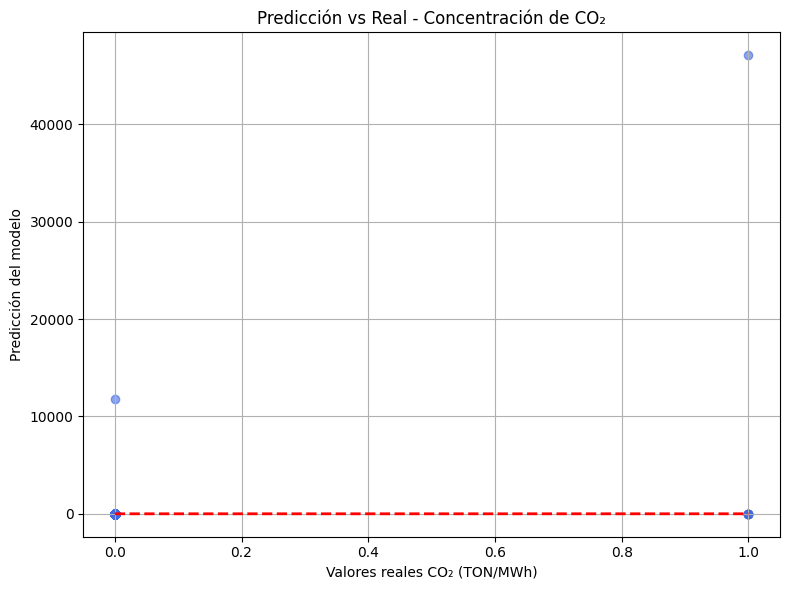

In [35]:


plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.6, color='royalblue')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--', lw=2)
plt.xlabel('Valores reales CO₂ (TON/MWh)')
plt.ylabel('Predicción del modelo')
plt.title('Predicción vs Real - Concentración de CO₂')
plt.grid(True)
plt.tight_layout()
plt.show()


In [34]:
import plotly.express as px
import pandas as pd

df_pred = pd.DataFrame({
    'Real': y_test,
    'Predicción': y_pred
})

fig = px.scatter(
    df_pred,
    x='Real',
    y='Predicción',
    title='Predicción vs Real - Concentración de CO₂',
    labels={'Real': 'Valor Real (TON/MWh)', 'Predicción': 'Valor Predicho'},
    opacity=0.7,
    trendline="ols"
)

fig.update_traces(marker=dict(size=6, color='green'))
fig.update_layout(template='plotly_white')
fig.show()


## Usamos Random Forest Regresion para predecir la Concentracion de CO2 por MWh generado 